##  Bear Image Classifier with fast.ai

This project is a bear detector. It will distinguish three types of bears: grizzly, black, and teddy bears.

## Section 1 - Setup

In [ ]:
# mount google drive
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
# install fastai libraries
!pip install fastai==2.3.0
!pip install fastcore==1.3.19
!pip install -Uqq fastbook
!pip install Pillow


In [ ]:
# import necessary libraries
import fastbook
from fastbook import *
# fastbook.setup_book()
import fastcore
import fastai
from fastai.vision.widgets import *

import warnings
warnings.filterwarnings("ignore")

import requests
import matplotlib.pyplot as plt
import PIL.Image
from io import BytesIO
import os

# from IPython.display import Image
# from IPython.core.display import HTML

In [ ]:
# Create a directory to store the images that we are about to download.
try:
  os.mkdir('images')
except:
  pass

In [ ]:
# Setup API key for Bing Image Search
subscription_key = "XXX" # Replace XXX with your API key
search_url = "https://api.bing.microsoft.com/v7.0/images/search"
headers = {"Ocp-Apim-Subscription-Key" : subscription_key}

In [ ]:
# Retrieve a set of image URLs that contains the keyword grizzly
search_term = "grizzly"

In [ ]:
params  = {"q": search_term, "license": "public", "imageType": "photo", "count":"150"}

In [ ]:
response = requests.get(search_url, headers=headers, params=params)
response.raise_for_status()
search_results = response.json()
thumbnail_urls = [img["thumbnailUrl"] for img in search_results["value"][:16]]

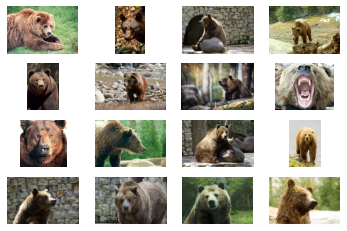

In [ ]:
# create a plot of the thumbnails to visualize the images retrieved
f, axes = plt.subplots(4, 4)
for i in range(4):
    for j in range(4):
        image_data = requests.get(thumbnail_urls[i+4*j])
        image_data.raise_for_status()
        image = Image.open(BytesIO(image_data.content))        
        axes[i][j].imshow(image)
        axes[i][j].axis("off")
plt.show()

In [ ]:
# Collate the list of image URLs from the JSON file
img_urls = [img['contentUrl'] for img in search_results["value"]]

In [ ]:
len(img_urls)

150

In [ ]:
# Look at the image from one of these URLs.
img_urls[1]

'https://get.pxhere.com/photo/nature-wilderness-animal-bear-wildlife-grizzly-zoo-fur-park-mammal-predator-fauna-brown-bear-wild-animal-face-whiskers-snout-head-vertebrate-switzerland-strong-animal-world-dangerous-jura-grizzly-bear-vallorbe-776137.jpg'

In [ ]:
# Download the image from the above URL 
# into a destination file named grizzly_test.jpg inside our images folder.
dest = 'images/grizzly_test.jpg'
download_url(img_urls[1], dest)

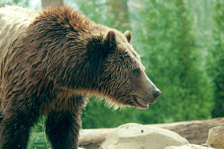

In [ ]:
# Display the image here as a 224x224 pixel thumbnail.
img = Image.open(dest)
img.to_thumb(224,224)

## Section 2 - Downloading Image Data

In [ ]:
# Download all the URLs for each of our search terms, namely **grizzly, black, teddy**, 
# using fastai's download_images.
# For each bear type, we will put it in a separate folder.
bear_types = ['grizzly','black','teddy']
path = Path('bears')

In [ ]:
if not path.exists():
    path.mkdir()
    for btype in bear_types:
        dest = (path/btype)
        dest.mkdir(exist_ok=True)
        
        # Obtain list of image URLs with that bear type keyword
        search_term = btype
        params  = {"q": search_term, "license": "public", "imageType": "photo", "count":"150"}
        response = requests.get(search_url, headers=headers, params=params)
        response.raise_for_status()
        search_results = response.json()
        img_urls = [img['contentUrl'] for img in search_results["value"]]
        
        # Download images from the list of image URLs
        download_images(dest, urls=img_urls)

In [ ]:
# Confirm that the image files are in the respective folders
img_files = get_image_files(path)
img_files

(#295) [Path('bears/teddy/00000038.jpg'),Path('bears/teddy/00000030.jpg'),Path('bears/teddy/00000104.jpg'),Path('bears/teddy/00000064.jpg'),Path('bears/teddy/00000077.jpg'),Path('bears/teddy/00000050.jpg'),Path('bears/teddy/00000078.jpg'),Path('bears/teddy/00000058.jpg'),Path('bears/teddy/00000026.jpg'),Path('bears/teddy/00000090.jpg')...]

In [ ]:
# Verify whether the downloaded files are corrupt or not
failed = verify_images(img_files)
failed

(#0) []

In [ ]:
# Remove the corrupt files (if any) from our dataset, using the map and unlink methods.
failed.map(Path.unlink)

(#0) []

## Section 3 - Preparing Image Datasets

In [ ]:
# Turn our downloaded data into a DataLoader object. 
# First, create a DataBlock as a template for creating a DataLoaders object.
bears = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=1),
    get_y=parent_label,
    item_tfms=Resize(128))

In [ ]:
# Initiate the DataLoader
dls = bears.dataloaders(path)

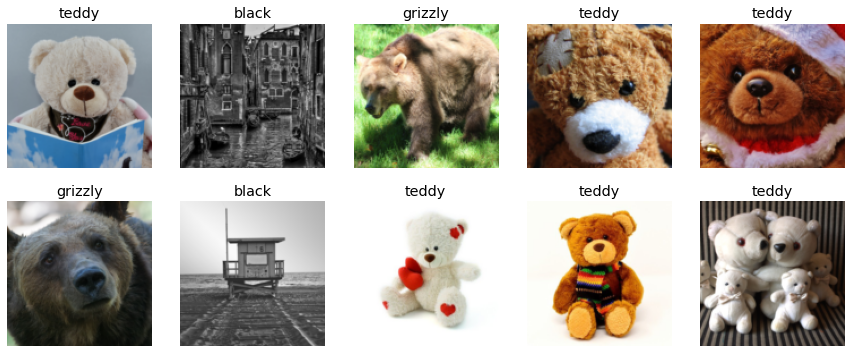

In [ ]:
# A DataLoaders includes validation and training sets. 
# Display a subset of 10 images in our validation set.
dls.valid.show_batch(max_n=10, nrows=2)

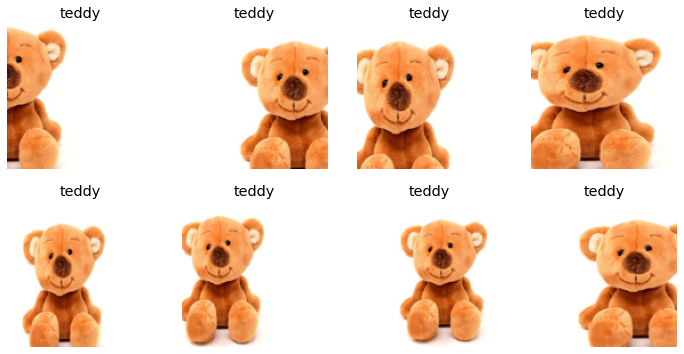

In [ ]:
# Our images are all different sizes, and this is a problem for deep learning: 
# we don't feed the model one image at a time but several of them (what we call a mini-batch). 
# To group them in a big array that is going to go through our model, 
# they all need to be of the same size. 
# So, we need to add a transform which will resize these images to the same size.
# Here is an example using RandomResizedCrop, 
# which randomly select part of the image, and crop to just that part.

bears = bears.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

### Data Augmentation

Data augmentation refers to creating random variations of our input data, such that they appear different, but do not actually change the meaning of the data. Examples of common data augmentation techniques for images are rotation, flipping, perspective warping, brightness changes and contrast changes.

For natural photo images such as the ones we are using here, we apply a standard set of augmentations using the aug_transforms function.

Because our images are now all the same size, we can apply these augmentations to an entire batch of them using the GPU. 

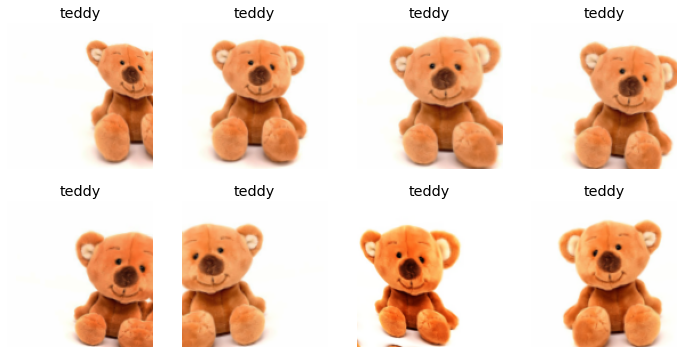

In [ ]:
# To tell fastai we want to use these transforms on a batch, we use the batch_tfms parameter.
bears = bears.new(item_tfms=Resize(128), batch_tfms=aug_transforms())
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

## Section 4 - Training the Model

We don't have a lot of data for our problem (150 pictures of each sort of bear at most), so to train our model, we'll use `RandomResizedCrop` with an image size of 224 px, and default `aug_transforms`:

In [ ]:
bears = bears.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = bears.dataloaders(path)

In [ ]:
# Using Convoluted Neural Network (CNN) for our image classification.
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.778197,0.629111,0.237288,00:31


epoch,train_loss,valid_loss,error_rate,time
0,0.507984,0.178419,0.050847,00:32
1,0.315291,0.168900,0.050847,00:31
2,0.214498,0.146416,0.016949,00:31
3,0.165847,0.146038,0.033898,00:32


The above results shows an error_rate of 0.039 (i.e. 61% accuracy). This is quite a good result, especially when we have not yet cleaned the data.

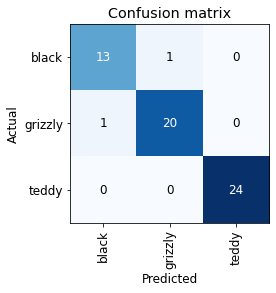

In [ ]:
# Visualize the results with a confusion matrix
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

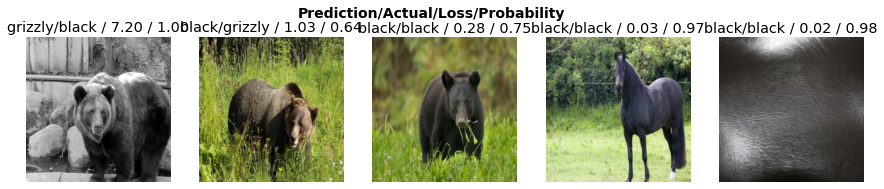

In [ ]:
# Find out the images with the highest loss
interp.plot_top_losses(5, nrows=1)

## Section 5 - Cleaning the Data

In [ ]:
# Clean the data using ImageClassifierCleaner
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
# Delete images marked as delete
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
    
# Update category of image to the newly specified category by moving it into the appropriate folder
for idx,cat in cleaner.change(): shutil.copyfile(cleaner.fns[idx], path/cat)

#### Retraining the model after data cleaning

In [ ]:
dls = bears.dataloaders(path)
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.538257,0.399954,0.176471,00:28


epoch,train_loss,valid_loss,error_rate,time
0,0.537575,0.170967,0.078431,00:28
1,0.367284,0.096804,0.019608,00:28
2,0.251566,0.064293,0.019608,00:28
3,0.188007,0.042883,0.019608,00:28


The error_rate after data cleaning has improved from 61% to around 80%.

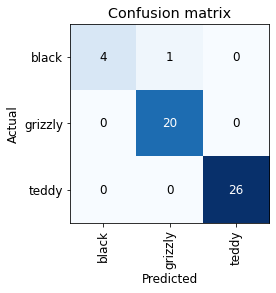

In [ ]:
# Visualize the results with a confusion matrix
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [ ]:
# Export the model to save both the architecture and the trained parameters.
learn.export()

In [ ]:
path = Path()
path.ls(file_exts='.pkl')

## Section 6 - Using Image Classifier for Inference

In [ ]:
# Create our inference learner from the exported file
learn_inf = load_learner(path/'export.pkl')

In [ ]:
# getting a sample image
ims = ['https://upload.wikimedia.org/wikipedia/commons/b/b3/Ursus_americanusDetail.jpg']
dest = 'images/test_black.jpg'
download_url(ims[0], dest)

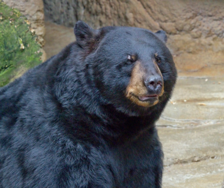

In [ ]:
# display our sample image
im = Image.open(dest)
im.to_thumb(224,224)

In [ ]:
# Pass the file to predict
learn_inf.predict('images/test_black.jpg')

('grizzly', tensor(1), tensor([1.0018e-01, 8.9981e-01, 1.5769e-05]))

In [ ]:
learn_inf.dls.vocab

['black', 'grizzly', 'teddy']

## Section 7 - Deployment as Web App

First, create a notebook application from the model using ipywidgets.<br>
Then, turn our notebook into a real application using Voila.<br>
Finally, deploy our application using Binder.

### Creating a Notebook App from the Model

In [ ]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [ ]:
# Retrieving the uploaded image
img = PILImage.create(btn_upload.data[-1])

In [ ]:
# Display the image uploaded by the user
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(224,224))
out_pl

Output()

In [ ]:
# Make a prediction using our inference learner
pred, pred_idx, probs = learn_inf.predict(img)

In [ ]:
# Display the result using a Label
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: grizzly; Probability: 0.8003')

In [ ]:
# Include a button for the user to do the classification
btn_run = widgets.Button(description='Classify Image')
btn_run

Button(description='Classify Image', style=ButtonStyle())

In [ ]:
# Add a click event handler; that is, a function that will be called when it's pressed.
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [ ]:
# We can now put them all in a vertical box (VBox) to complete our GUI:
VBox([widgets.Label('Select your bear!'), 
      btn_upload, btn_run, out_pl, lbl_pred])